In [1]:
using DifferentialEquations
using Plots


ERROR: LoadError: TaskFailedException

    nested task error: MethodError: no method matching (SciMLBase.NonlinearFunction{true, SciMLBase.FullSpecialize, BoundaryValueDiffEq.var"#254#260"{BoundaryValueDiffEq.MIRKCache{true, Float64, Tuple{Int64}, SciMLBase.BVPFunction{true, SciMLBase.FullSpecialize, false, typeof(BoundaryValueDiffEq.f1!), typeof(BoundaryValueDiffEq.bc1!), LinearAlgebra.UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing, SymbolicIndexingInterface.SymbolCache{Nothing, Nothing, Nothing, Nothing, Dict{Any, Any}}, Nothing}, typeof(BoundaryValueDiffEq.bc1!), SciMLBase.BVProblem{Vector{Float64}, Tuple{Float64, Float64}, true, false, SciMLBase.NullParameters, SciMLBase.BVPFunction{true, SciMLBase.FullSpecialize, false, typeof(BoundaryValueDiffEq.f1!), typeof(BoundaryValueDiffEq.bc1!), LinearAlgebra.UniformScaling{Bool}, Nothing, Nothing,

ErrorException: Failed to precompile DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa] to "/Users/stefanpetrov/.julia/compiled/v1.11/DifferentialEquations/jl_zgUaOW".

In [6]:

# Define parameters in a struct for clarity
struct Params
    a::Float64       # acquisition rate
    d::Float64       # churn sensitivity
    T::Float64       # required value threshold per customer
    f_::Float64      # fraction of engineers on product dev
    E_::Float64      # total engineers
    q0::Float64      # product dev base rate
    m_decay::Float64 # market decay rate
    p_::Float64      # price per customer
    cost_::Float64   # cost per engineer
end


In [ ]:
struct A
    b::Float64
end
a= A(1.0)

MethodError: MethodError: no method matching A(; b::Float64)
The type `A` exists, but no method is defined for this combination of argument types when trying to construct it.

Closest candidates are:
  A(!Matched::Float64) got unsupported keyword argument "b"
   @ Main ~/Documents/GitHub/ML-notebooks/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X12sZmlsZQ==.jl:2
  A(!Matched::Any) got unsupported keyword argument "b"
   @ Main ~/Documents/GitHub/ML-notebooks/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X12sZmlsZQ==.jl:2


In [11]:
function Params(; a=0.1, d=0.5, T=1.0, f_=0.5, E_=10.0, q0=0.01, m_decay=0.02, p_=100.0, cost_=50.0)
    return Params(a, d, T, f_, E_, q0, m_decay, p_, cost_)
end

# Set parameters
p = Params(
    a=0.1,
    d=0.5,
    T=1.0,
    f_=0.5,
    E_=10.0,
    q0=0.01,
    m_decay=0.02,
    p_=100.0,
    cost_=50.0
)



Params(0.1, 0.5, 1.0, 0.5, 10.0, 0.01, 0.02, 100.0, 50.0)

In [12]:

function model!(du, u, p, t)
    Q, C, M, B = u
    # epsilon to avoid division by zero errors
    epsilon = 1e-9
    
    # Compute delivered value and churn
    delivered_value = ((1 - p.f_) * p.E_ * Q) / (C + epsilon)
    churn = p.d * max(0, p.T - delivered_value) * C

    # Differential equations
    dQ = p.q0 * p.f_ * p.E_ * C
    dC = p.a * M - churn
    dM = -p.m_decay * M
    dB = p.p_ * C - p.cost_ * p.E_

    du[1] = dQ
    du[2] = dC
    du[3] = dM
    du[4] = dB
end


model! (generic function with 1 method)

In [14]:

# Initial conditions
u0 = [0.0,   # Q
      1.0,   # C
      100.0, # M
      10000.0] # B


4-element Vector{Float64}:
     0.0
     1.0
   100.0
 10000.0

In [15]:

tspan = (0.0, 100.0)


(0.0, 100.0)

In [16]:

prob = ODEProblem(model!, u0, tspan, p)
sol = solve(prob, Rodas5())  # e.g. a stiff solver


retcode: Success
Interpolation: specialized 4rd order "free" stiffness-aware interpolation
t: 21-element Vector{Float64}:
   0.0
   0.033485963805418045
   0.14413829125584804
   0.3415050035430205
   0.6255627320205022
   1.015895250606495
   1.540138496168868
   2.2272947923334967
   3.1145774024530803
   4.2510854937318
   ⋮
   8.699957030291424
   9.335243895938815
  15.688112552412719
  24.20867280622185
  35.98799091835207
  51.403815719814475
  71.2489641002058
  95.60159606533072
 100.0
u: 21-element Vector{Vector{Float64}}:
 [0.0, 1.0, 100.0, 10000.0]
 [0.0019391089115166273, 1.3154339248131504, 99.93305049357902, 9987.135235920323]
 [0.012023950086608991, 2.3209483754168527, 99.71213853543667, 9951.97875454529]
 [0.04327006496463512, 3.9855600913237073, 99.31931720488498, 9915.787628157754]
 [0.11543597380125796, 6.131693254014455, 98.75666857234063, 9918.090581592262]
 [0.26077622788039884, 8.697568046099912, 97.98871127615813, 10013.604830457547]
 [0.5283628305739257, 11.64

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


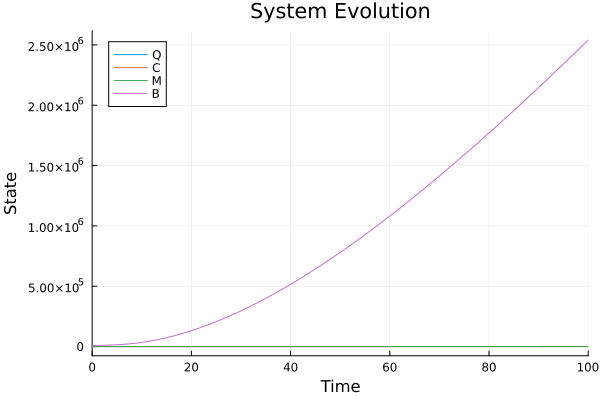

In [17]:

# Plot results
plot(sol, vars=(0,1), label="Q") # Q
plot!(sol, vars=(0,2), label="C") # C
plot!(sol, vars=(0,3), label="M") # M
plot!(sol, vars=(0,4), label="B") # B
xlabel!("Time")
ylabel!("State")
title!("System Evolution")

In [1]:
using DifferentialEquations
using OptimalControl
using ModelingToolkit
using Plots

# We will treat 'a(t)' and 'f_(t)' as control variables to be optimized.
# The states are Q(t), C(t), M(t), B(t).
# We want to maximize the final bank balance B(tf), while keeping B(t) ≥ 0.
# We also impose bounds on the controls a(t) and f_(t).

# Define parameters that remain constant
E_ = 10.0       # total engineers
q0 = 0.01        # product dev base rate
m_decay = 0.02   # market decay rate
p_ = 100.0       # price per customer
cost_ = 50.0     # cost per engineer
d = 0.5          # churn sensitivity
T_thresh = 1.0   # required value threshold per customer
epsilon = 1e-9   # small number to avoid div-by-zero
t0 = 0.0
tf = 50.0  # shorten time horizon for demonstration

# Variables and parameters for OptimalControl
@variables t
@variables Q(t) C(t) M(t) B(t)   # States
@variables a(t) f_(t)            # Controls

# Delivered value per customer
delivered_value = ((1 - f_(t))*E_*Q(t)) / (C(t) + epsilon)
# Churn, ensuring differentiability might be tricky with "max(0, ...)".
# For optimization, we can either assume always T_thresh > delivered_value or use a smooth approximation:
# Here, we use a smooth approximation to max(0,x): max_approx(x) ~ log(1+exp(x))/β - do a piecewise linear approx.
# For simplicity, let's assume delivered_value ≤ T_thresh always is not guaranteed.
# Let's use a smooth approximation to keep it differentiable:
β = 10.0
churn = d * ( (1/β)*log(1 + exp(β*(T_thresh - delivered_value))) ) * C(t)

@parameters E_=E_ q0=q0 m_decay=m_decay p_=p_ cost_=cost_ d=d T_thresh=T_thresh epsilon=epsilon β=β
@derivatives D'~t

# ODE model for the system
eqs = [
    D(Q) ~ q0 * f_(t) * E_ * C(t),
    D(C) ~ a(t)*M(t) - churn,
    D(M) ~ -m_decay*M(t),
    D(B) ~ p_*C(t) - cost_*E_
]

# Initial conditions
u0 = [Q => 0.0,
      C => 1.0,
      M => 100.0,
      B => 10000.0]

@named sys = ODESystem(eqs, t, [Q,C,M,B], [a,f_])

# Define an Optimal Control Problem
# Objective: Maximize B(tf) => Minimize -B(tf)
# We'll define a terminal cost M(x(tf)) = -B(tf), no running cost.
L = 0  # Running cost
M_cost = -B(tf) # Terminal cost

ocp = OCP(sys, t0, tf, L, M_cost;
          control_variables=[a,f_],
          paths=[B(t) ≥ 0],      # Path constraint: B(t)≥0
          controlbounds=Dict(a=>(0.0,0.5), f_=>(0.0,1.0)) # For example: acquisition rate ≤0.5, fraction between 0 and 1
)

# Solve the OCP
# Choose an optimization method and discretization
N = 50 # number of intervals
discretization = DirectCollocation(ChebyshevCollocation(N))
prob_ocp = OCPProblem(ocp, discretization, u0 = u0)
sol_ocp = solve(prob_ocp, Ipopt(); print_level=0)

# Extract the optimal solution
ts = LinRange(t0, tf, 200)
Q_opt = sol_ocp(Q, ts)
C_opt = sol_ocp(C, ts)
M_opt = sol_ocp(M, ts)
B_opt = sol_ocp(B, ts)
a_opt = sol_ocp(a, ts)
f_opt = sol_ocp(f_, ts)

# Plot results
plot(ts, Q_opt, label="Q", xlabel="time", ylabel="State value", title="States")
plot!(ts, C_opt, label="C")
plot!(ts, M_opt, label="M")
plot!(ts, B_opt, label="B")

# Plot controls
plot(ts, a_opt, label="a(t)", xlabel="time", ylabel="Control value", title="Controls")
plot!(ts, f_opt, label="f_(t)")

ERROR: LoadError: TaskFailedException

    nested task error: MethodError: no method matching (SciMLBase.NonlinearFunction{true, SciMLBase.FullSpecialize, BoundaryValueDiffEq.var"#254#260"{BoundaryValueDiffEq.MIRKCache{true, Float64, Tuple{Int64}, SciMLBase.BVPFunction{true, SciMLBase.FullSpecialize, false, typeof(BoundaryValueDiffEq.f1!), typeof(BoundaryValueDiffEq.bc1!), LinearAlgebra.UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing, SymbolicIndexingInterface.SymbolCache{Nothing, Nothing, Nothing, Nothing, Dict{Any, Any}}, Nothing}, typeof(BoundaryValueDiffEq.bc1!), SciMLBase.BVProblem{Vector{Float64}, Tuple{Float64, Float64}, true, false, SciMLBase.NullParameters, SciMLBase.BVPFunction{true, SciMLBase.FullSpecialize, false, typeof(BoundaryValueDiffEq.f1!), typeof(BoundaryValueDiffEq.bc1!), LinearAlgebra.UniformScaling{Bool}, Nothing, Nothing,

ErrorException: Failed to precompile DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa] to "/Users/stefanpetrov/.julia/compiled/v1.11/DifferentialEquations/jl_gxvSXd".

69.89145
38.1363
2566.0623
100.458664
51.22659
63.954365
70.63628
120.33955
269.35107
469.19583
502.86282
373.53308
236.32253
150.4319
105.76775
83.801796
73.08806
67.90378
65.48731
64.46015
64.09848
64.00966
63.98177
63.905975
63.733475
63.44886
63.054302
62.55958
61.9763
61.315605
60.585724
59.79246
58.938477
58.02414
57.04792
56.006573
54.895966
53.712082
52.451138
51.110996
49.691948
48.198612
46.64067
45.03518
43.40861
41.79725
40.24901
38.82128
37.578743
36.58603
35.89797
35.547333
35.531178
35.80322
36.27194
36.814564
37.298283
37.613956
37.696968
37.540085
37.190422
36.72493
36.22943
35.777157
35.415688
35.165787
35.024067
34.97261
34.984715
35.0328
35.09179
35.14162
35.168007
35.163155
35.12399
35.052444
34.95374
34.835545
34.70675
34.57655
34.453205
34.34329
34.250664
34.17618
34.11831
34.072647
34.033607
33.99477
33.950855
33.897804
33.834007
33.75942
33.675907
33.58637
33.49398
33.401802
33.311386
33.223846
33.139034
33.05603
32.9734
32.97342
32.568447
28.535997
18.653889
1

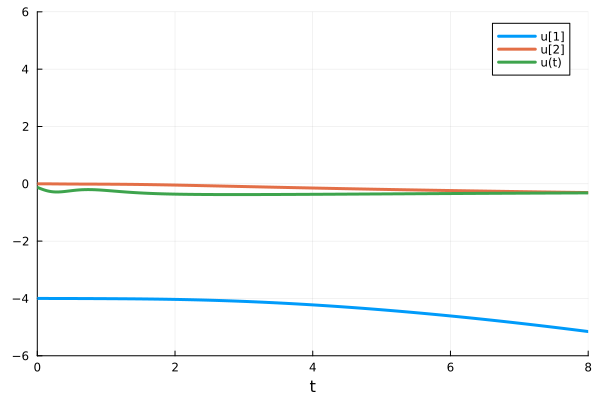

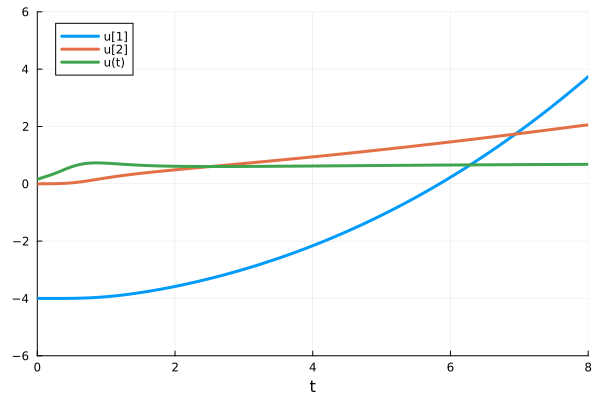

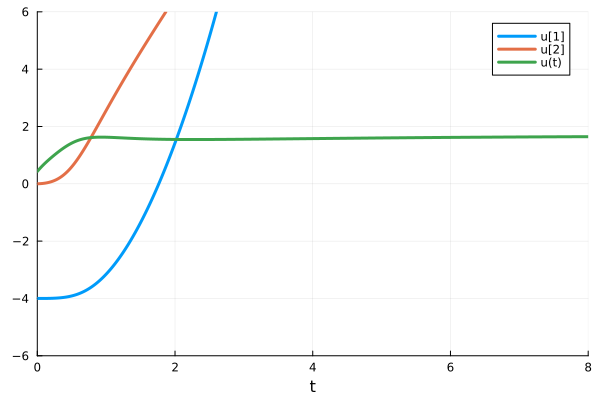

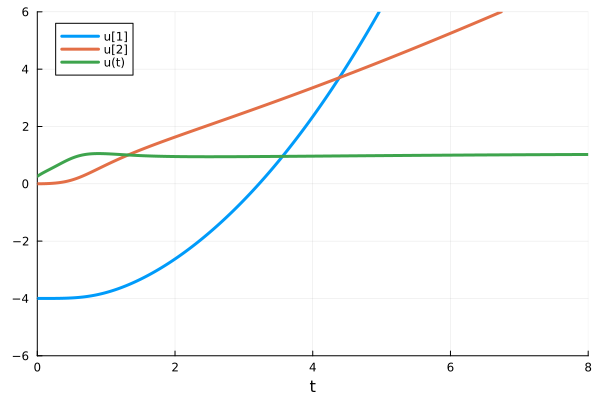

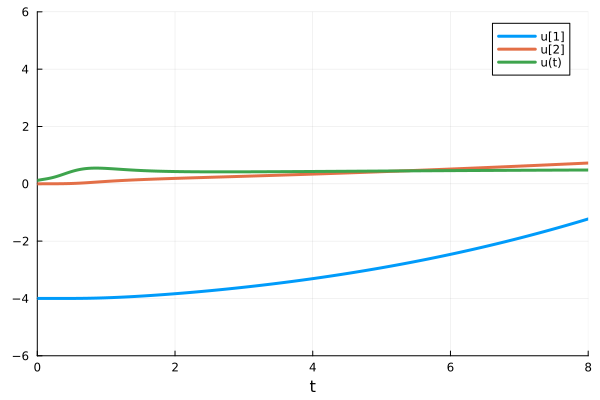

...

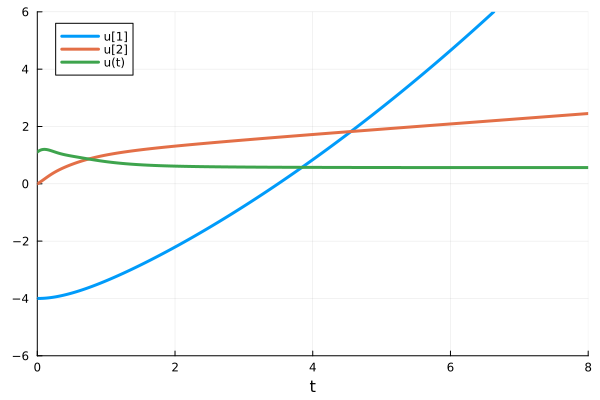

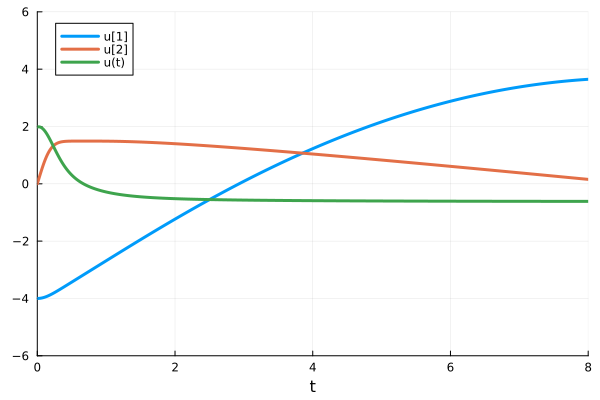

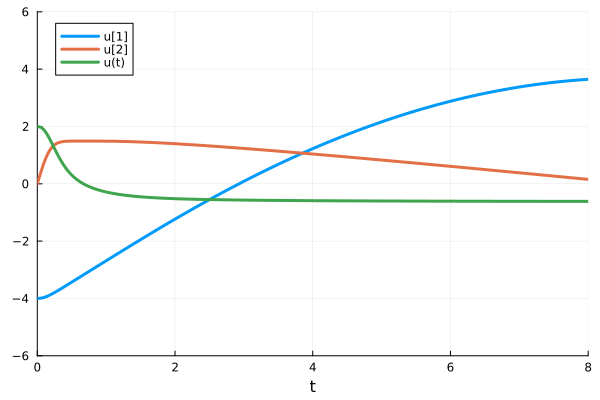

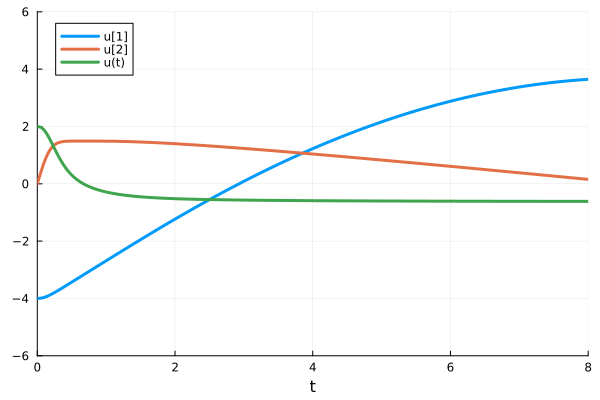

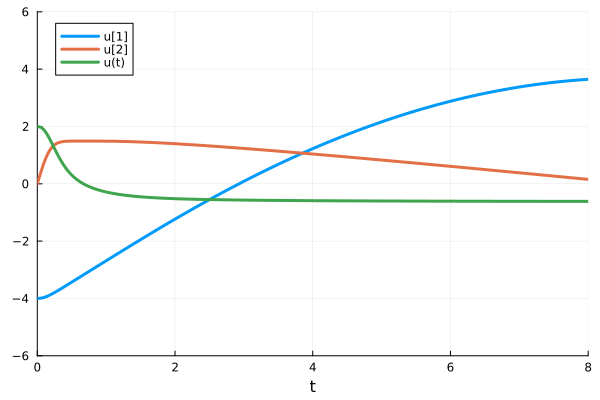

retcode: Success
u: 1153-element Vector{Float32}:
  1.0674272
 -2.8890698
 -0.22006515
  2.792859
 -1.4818435
  0.033318684
 -0.97573537
 -1.6621411
 -0.7843629
  1.443077
  ⋮
 -0.2639016
  0.43009967
 -0.32258874
  0.08249597
  0.22111826
 -0.015206418
 -0.0832821
  0.22715032
 -0.043123852

In [2]:
using Lux, ComponentArrays, OrdinaryDiffEq, Optimization, OptimizationOptimJL,
      OptimizationOptimisers, SciMLSensitivity, Zygote, Plots, Statistics, Random,
      ForwardDiff

rng = Random.default_rng()
tspan = (0.0f0, 8.0f0)

ann = Chain(Dense(1, 32, tanh), Dense(32, 32, tanh), Dense(32, 1))
ps, st = Lux.setup(rng, ann)
p = ComponentArray(ps)

θ, _ax = getdata(p), getaxes(p)
const ax = _ax

function dxdt_(dx, x, p, t)
    ps = ComponentArray(p, ax)
    x1, x2 = x
    dx[1] = x[2]
    dx[2] = first(ann([t], ps, st))[1]^3
end
x0 = [-4.0f0, 0.0f0]
ts = Float32.(collect(0.0:0.01:tspan[2]))
prob = ODEProblem(dxdt_, x0, tspan, θ)
solve(prob, Vern9(), abstol = 1e-10, reltol = 1e-10)

function predict_adjoint(θ)
    Array(solve(prob, Vern9(), p = θ, saveat = ts))
end
function loss_adjoint(θ)
    x = predict_adjoint(θ)
    ps = ComponentArray(θ, ax)
    mean(abs2, 4.0f0 .- x[1, :]) + 2mean(abs2, x[2, :]) +
    mean(abs2, [first(first(ann([t], ps, st))) for t in ts]) / 10
end

l = loss_adjoint(θ)
cb = function (state, l; doplot = true)
    println(l)

    ps = ComponentArray(state.u, ax)

    if doplot
        p = plot(solve(remake(prob, p = state.u), Tsit5(), saveat = 0.01),
            ylim = (-6, 6), lw = 3)
        plot!(p, ts, [first(first(ann([t], ps, st))) for t in ts], label = "u(t)", lw = 3)
        display(p)
    end

    return false
end

# Setup and run the optimization

loss1 = loss_adjoint(θ)
adtype = Optimization.AutoForwardDiff()
optf = Optimization.OptimizationFunction((x, p) -> loss_adjoint(x), adtype)

optprob = Optimization.OptimizationProblem(optf, θ)
res1 = Optimization.solve(
    optprob, OptimizationOptimisers.Adam(0.01), callback = cb, maxiters = 100)

optprob2 = Optimization.OptimizationProblem(optf, res1.u)
res2 = Optimization.solve(
    optprob2, OptimizationOptimJL.BFGS(), callback = cb, maxiters = 100)